In [1]:
versioninfo()

Julia Version 1.10.2
Commit bd47eca2c8a (2024-03-01 10:14 UTC)
Build Info:
  Official https://julialang.org/ release
Platform Info:
  OS: Linux (x86_64-linux-gnu)
  CPU: 32 × Intel(R) Xeon(R) CPU E5-2630 v3 @ 2.40GHz
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-15.0.7 (ORCJIT, haswell)
Threads: 1 default, 0 interactive, 1 GC (on 32 virtual cores)
Environment:
  JULIA_PKG_SERVER = https://mirrors.tuna.tsinghua.edu.cn/julia


In [5]:
# set the output format of gr backend to png while the default is svg, which disappears in jupyter pages (after restart).
# StatsPlots has an identical gr() function.
@time using Plots;
#gr(fmt = "png")
@time gr(fmt = :png)

@time using StatsPlots; 
@time gr(fmt = :png)

  0.000975 seconds (133 allocations: 12.797 KiB)
  0.000047 seconds (5 allocations: 576 bytes)
  0.000144 seconds (133 allocations: 12.805 KiB)
  0.000040 seconds (5 allocations: 576 bytes)


Plots.GRBackend()

In [4]:
# Run this cell again if such errors: LoadError: UndefVarError: `TuringOptimExt` not defined
# TuringOptimExt is an extension of Turing (not public) but StatisticalRethinking tries to use "ModeResult" from TuringOptimExt

# Note: Below sequence is important. First activate the project
# followed by `using` or `import` statements. Pretty much all
# scripts use StatisticalRethinking. If mcmc sampling is
# needed, it must be loaded before StatisticalRethinking:
using Turing
# more using lines, e.g.
using CSV, DataFrames, Distributions
using StatisticalRethinking
# @df is defined by StatsPlots
using StatisticalRethinkingPlots, StatsPlots, Plots
# set the output format of gr backend to png. default is svg, which disappears in jupyter pages (after restart).
@time gr(fmt = :png)


using Random
using StatsBase
using Distributions
using StatsFuns
using Logging

using Optim
using StatisticalRethinking

default(labels=false)
Logging.disable_logging(Logging.Warn);

  0.000041 seconds (5 allocations: 576 bytes)


# 9.1 Good King Markov and his 10-island kingdom

## Code 9.1

In [6]:
Random.seed!(1)
num_weeks = 10^5
positions = []
current = 2

for i ∈ 1:num_weeks
    # record current position
    push!(positions, current)
    # flip coin to generate proposal
    proposal = current + sample([-1, 1])
    # handle loops around
    proposal < 1 && (proposal = 10)
    proposal > 10 && (proposal = 1)
    # move?
    prob_move = proposal / current
    rand() < prob_move && (current = proposal)
end

## Code 9.2 Figure 9.2

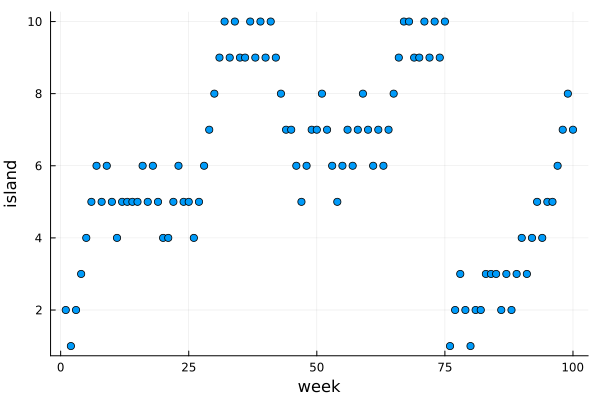

In [7]:
scatter(positions[1:100], xlab="week", ylab="island")

## Code 9.3

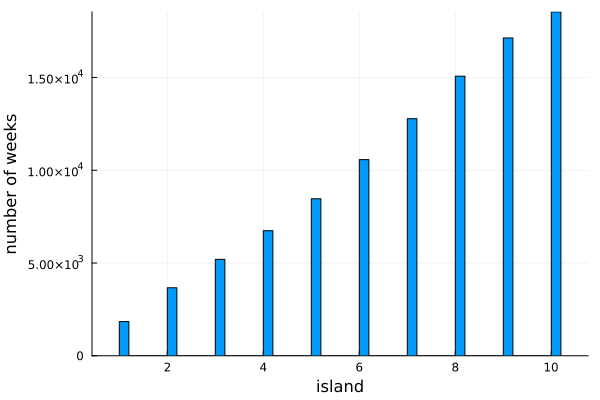

In [8]:
histogram(positions, xlab="island", ylab="number of weeks")

# 9.2 Metropolis algorithms

## Code 9.4 Curse of dimensionality in MV-Normal

In [79]:
function draw_MVNormal_density_concentration(; D=10, T=1000)
    # D is #dimensions.
    # T is #samples.
    #for D in [1,10,100,1000]        
    # Normal mean at 0, stddev=1.
    @time Y = rand(MvNormal(zeros(D), ones(D)), T)
    @time Rd = sqrt.(sum.(eachcol(Y.^2)))
    plot(density(Rd), xlim = (-1, 20))
    xlabel!("Distance to the center")
    ylabel!("Density")
end

draw_MVNormal_density_concentration (generic function with 3 methods)

  0.000033 seconds (4 allocations: 8.125 KiB)
  0.000011 seconds (2 allocations: 15.875 KiB)


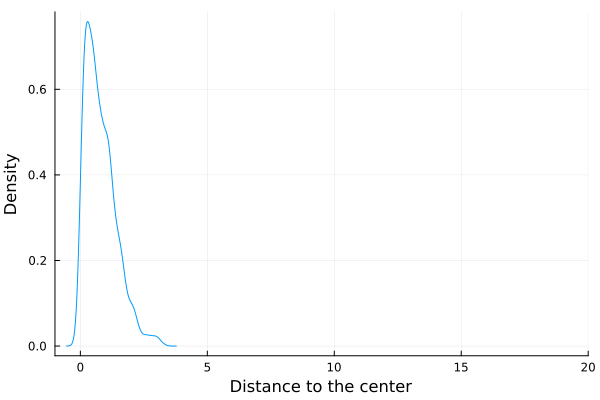

In [80]:
draw_MVNormal_density_concentration(D=1, T=1000)

  0.000192 seconds (5 allocations: 78.594 KiB)
  0.000061 seconds (3 allocations: 86.109 KiB)


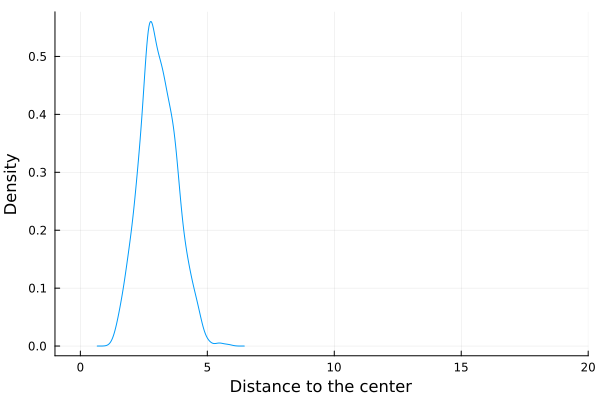

In [81]:
draw_MVNormal_density_concentration(D=10, T=1000)

  0.001614 seconds (5 allocations: 783.922 KiB)
  0.000314 seconds (3 allocations: 789.234 KiB)


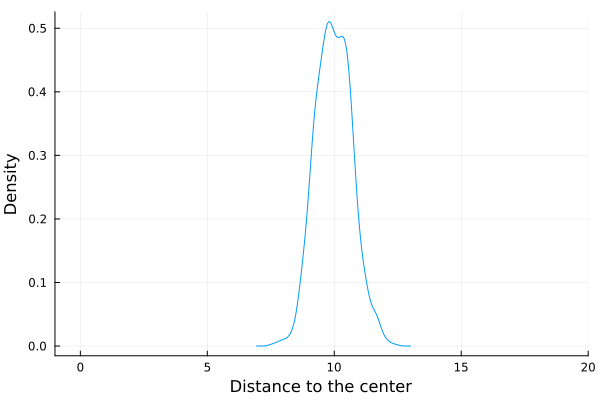

In [82]:
draw_MVNormal_density_concentration(D=100, T=1000)

In [57]:
@show size(Y)

size(Y) = (10, 1000)


(10, 1000)

In [62]:
@time sqrt.(sum.(eachcol(Y.^2)))

  0.000143 seconds (12 allocations: 86.344 KiB)


1000-element Vector{Float64}:
 2.3205501628370313
 2.9367159498263833
 2.8933925526123465
 2.8825136938952403
 2.884735040883977
 2.4198355576288098
 2.658354040347115
 2.673912991788573
 3.482502386274858
 3.778928222748504
 3.7272856414800195
 3.1145765601600615
 3.6062399600646065
 ⋮
 4.04602461761879
 2.1856347655158834
 3.1962901686192495
 3.1692535374001953
 1.077095246882365
 3.6600936609673544
 2.729160683263009
 2.223385695541407
 3.43060336504033
 3.2613100234079275
 3.0140594489765435
 2.9897851357977627

# 9.3 Hamiltonian Monte Carlo

## Code 9.5 Simulate some data

In [9]:
Random.seed!(7)

x = rand(Normal(), 50)
y = rand(Normal(), 50)
x = standardize(ZScoreTransform, x)
y = standardize(ZScoreTransform, y);

- U = -log(likelihood * prior): negative log-probability of data given parameters

In [10]:
function U(q::Vector{Float64}; a=0, b=1, k=0, d=1)::Float64
    μy, μx = q
    U = sum(normlogpdf.(μy, 1, y)) + sum(normlogpdf.(μx, 1, x)) 
    U += normlogpdf(a, b, μy) + normlogpdf(k, d, μx)
    -U
end

U (generic function with 1 method)

## Code 9.6 Gradient $\nabla U$

In [11]:
function ∇U(q::Vector{Float64}; a=0, b=1, k=0, d=1)::Vector{Float64}
    μy, μx = q
    G₁ = sum(y .- μy) + (a - μy) / b^2  # ∂U/∂μy
    G₂ = sum(x .- μx) + (k - μx) / d^2  # ∂U/∂μx
    [-G₁, -G₂]
end

∇U (generic function with 1 method)

## Code 9.8, 9.9, 9.10 (HMC2 funcition)

In [12]:
"""
HMC2(U, ∇U, ϵ::Float64, L::Int, current_q::Vector{Float64})

Hamiltonian Monte Carlo Sampling.

Args:
- U: -log-likelihood function given q.
- ∇U: gradient function of U
- ϵ: step size
- L: number of leapfrogs.
- current_q: initial estimates of parameters.

Returns:
- (q=current_q, traj=qtraj, ptraj=ptraj, accept=accept)
- ptraj: momentum trajectory.
- accept: Boolean, if to accept the trajectory
"""
function HMC2(U, ∇U, ϵ::Float64, L::Int, current_q::Vector{Float64})
    q = current_q  # current estimates of parameters
    p = rand(Normal(), length(q))  # random flick - p is momentum
    current_p = p   # initial momentum
    
    # make a half step for momentum at the beginning
    p -= ϵ .* ∇U(q) ./ 2
    
    # initialize bookkeeping - saves trajectory
    qtraj = [q]
    ptraj = [p]
    
    # Alternate full steps for position and momentum
    for i ∈ 1:L
        q += @. ϵ * p  # full step for the position
        # make a full step for the momentum except at the end of trajectory
        if i != L
            p -= ϵ * ∇U(q)
            push!(ptraj, p)
        end
        push!(qtraj, q)
    end
    
    # Make a half step for momentum at the end
    p -= ϵ * ∇U(q) / 2
    push!(ptraj, p)
    
    # negate momentum at the end of trajectory to make the proposal symmetric
    p = -p
    
    # evaluate potential and kinetic energies at the start and the end of trajectory
    current_U = U(current_q)
    current_K = sum(current_p.^2)/2
    proposed_U = U(q)
    proposed_K = sum(p.^2)/2
    
    # accept or reject the state at the end of trajectory, returning either
    # the position at the end of the trajectory or the initial position
    accept = (rand() < exp(current_U - proposed_U + current_K - proposed_K))

    if accept
        current_q = q
    end
    
    (q=current_q, traj=qtraj, ptraj=ptraj, accept=accept)
end

HMC2

In [50]:
?HMC2

search: HMC2 HMC HMCDA hmc SGHMC eachmatch Hypergeometric



HMC2(U, ∇U, ϵ::Float64, L::Int, current_q::Vector{Float64})

Hamiltonian Monte Carlo Sampling.

Args:

  * U: -log-likelihood function given q.
  * ∇U: gradient function of U
  * ϵ: step size
  * L: number of leapfrogs.
  * current_q: initial estimates of parameters.

Returns:

  * (q=current_q, traj=qtraj, ptraj=ptraj, accept=accept)
  * ptraj: momentum trajectory.
  * accept: Boolean, if to accept the trajectory


## Code 9.7 Sample the posterior via HMC2

true
true
true
true


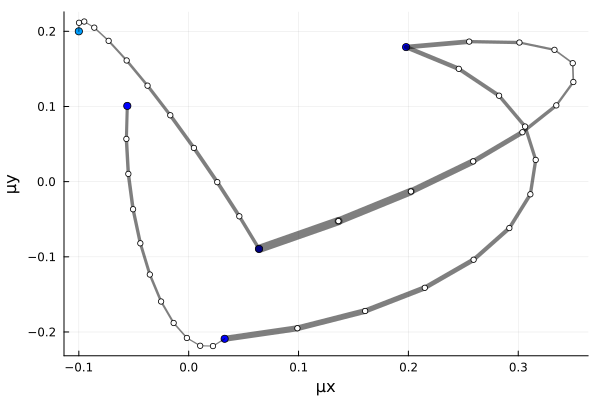

In [13]:
Random.seed!(1)
Q = (q=[-0.1, 0.2],)
# pr is un-used?
pr = 0.3
# step size AKA ϵ
step = 0.03
# number of leapfrogs
L = 11
n_samples = 4
p = scatter([Q.q[1]], [Q.q[2]], xlab="μx", ylab="μy")

for i ∈ 1:n_samples
    Q = HMC2(U, ∇U, step, L, Q.q)
    println(Q.accept)
    if n_samples < 10 
        cx, cy = [], []
        for j ∈ 1:L
            K0 = sum(Q.ptraj[j].^2)/2
            plot!(
                [Q.traj[j][1], Q.traj[j+1][1]],
                [Q.traj[j][2], Q.traj[j+1][2]],
                lw=1+2*K0,
                c=:black,
                alpha=0.5
            )
            push!(cx, Q.traj[j+1][1])
            push!(cy, Q.traj[j+1][2])
        end
        scatter!(cx, cy, c=:white, ms=3)
    end
    scatter!([Q.q[1]], [Q.q[2]], shape=(Q.accept ? :circle : :rect), c=:blue)
end
p

# 9.4 Easy HMC: ulam

## Code 9.11 Load terrain ruggedness dataset

In [14]:
d = DataFrame(CSV.File("data/rugged.csv"))
dd = d[completecases(d, :rgdppc_2000),:]
dd[:,:log_gdp] = log.(dd.rgdppc_2000);
dd[:,:log_gdp_std] = dd.log_gdp / mean(dd.log_gdp)
dd[:,:rugged_std] = dd.rugged / maximum(dd.rugged)
dd[:,:cid] = @. ifelse(dd.cont_africa == 1, 1, 2);

## Code 9.12

### 9.12.1 MAP() estimations of model m8_3

In [23]:
r̄ = mean(dd.rugged_std);

@model function model_m8_3(rugged_std, cid,  log_gdp_std, rugged_mean)
    σ ~ Exponential()
    a ~ MvNormal([1, 1], 0.1)
    b ~ MvNormal([0, 0], 0.3)
    μ = @. a[cid] + b[cid] * (rugged_std - rugged_mean)
    log_gdp_std ~ MvNormal(μ, σ)
end

@time m8_3_MAP = optimize(model_m8_3(dd.rugged_std, dd.cid,  dd.log_gdp_std, r̄), MAP())
# following sample() does not work.
#m8_3_df = DataFrame(sample(m8_3_MAP, 1000))


  0.557432 seconds (192.33 k allocations: 14.701 MiB, 99.46% compilation time: 60% of which was recompilation)


ModeResult with maximized lp of 137.00
[0.10948706712781212, 0.886558222955178, 1.050575463425671, 0.1325039088916445, -0.14257645312471534]

In [19]:
coef(m8_3_MAP)

5-element Named Vector{Float64}
A    │ 
─────┼──────────
σ    │  0.109487
a[1] │  0.886558
a[2] │   1.05058
b[1] │  0.132504
b[2] │ -0.142576

- Sampling from prior ignores data and produces estimates directly from the prior.

In [21]:
@time m8_3_prior_df = DataFrame(sample(model_m8_3(dd.rugged_std, dd.cid,  dd.log_gdp_std, r̄), Prior(),
		1_000, init_theta = m8_3_MAP.values.array))
describe(m8_3_prior_df)

  3.045810 seconds (3.22 M allocations: 217.153 MiB, 4.03% gc time, 95.50% compilation time)


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,a[1],0.996748,0.653635,0.998418,1.28914,0,Float64
2,a[2],1.00299,0.687931,1.00123,1.32032,0,Float64
3,b[1],0.00617434,-1.16085,0.0108208,0.896205,0,Float64
4,b[2],0.0235396,-0.87727,0.0357628,0.920955,0,Float64
5,σ,0.905062,0.000232403,0.622162,8.16407,0,Float64


### 9.12.2 HMC/NUTS() estimates of model m8_3

In [25]:
@time m8_3_NUTS_df = DataFrame(sample(model_m8_3(dd.rugged_std, dd.cid,  dd.log_gdp_std, r̄), NUTS(),
		1_000, init_theta = m8_3_MAP.values.array))
describe(m8_3_NUTS_df)

  3.525981 seconds (2.37 M allocations: 579.479 MiB, 3.29% gc time, 84.07% compilation time: 86% of which was recompilation)


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,a[1],0.886288,0.832228,0.886124,0.939829,0,Float64
2,a[2],1.05068,1.024,1.05079,1.08236,0,Float64
3,b[1],0.132691,-0.15295,0.132571,0.392305,0,Float64
4,b[2],-0.142205,-0.323893,-0.143651,0.0553646,0,Float64
5,σ,0.111307,0.0897925,0.11123,0.133009,0,Float64


- NUTS with or without initial parameter estimates makes little difference.

In [32]:
@time m8_3_NUTS0_df = DataFrame(sample(model_m8_3(dd.rugged_std, dd.cid,  dd.log_gdp_std, r̄), NUTS(),
		1_000))
describe(m8_3_NUTS0_df)

  2.622661 seconds (2.16 M allocations: 488.808 MiB, 4.50% gc time, 80.55% compilation time)


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,a[1],0.886887,0.833773,0.887353,0.933433,0,Float64
2,a[2],1.05079,1.01819,1.05072,1.08225,0,Float64
3,b[1],0.134966,-0.0660712,0.132905,0.430515,0,Float64
4,b[2],-0.14143,-0.344251,-0.139627,0.0157555,0,Float64
5,σ,0.111472,0.0892906,0.111224,0.135228,0,Float64


In [17]:
propertynames(m8_3_MAP)

(:values, :optim_result, :lp, :f)

In [19]:
fieldnames(typeof(m8_3_MAP))

(:values, :optim_result, :lp, :f)

- MAP estimates are not that different from NUTS(), while being much faster.

In [23]:
m8_3_MAP.values

5-element Named Vector{Float64}
A    │ 
─────┼──────────
σ    │  0.109487
a[1] │  0.886558
a[2] │   1.05058
b[1] │  0.132504
b[2] │ -0.142576

In [14]:
coef(m8_3_MAP)

5-element Named Vector{Float64}
A    │ 
─────┼──────────
σ    │  0.109487
a[1] │  0.886558
a[2] │   1.05058
b[1] │  0.132504
b[2] │ -0.142576

In [35]:
methodswith(typeof(m8_3_MAP))

0-element Vector{Method}

- MLE estimates are also close to MAP, with `b` a bit different (~5%).

In [26]:
@time m8_3_MLE = optimize(model_m8_3(dd.rugged_std, dd.cid,  dd.log_gdp_std, r̄), MLE())
m8_3_MLE.values

  0.729506 seconds (670.88 k allocations: 44.216 MiB, 99.58% compilation time)


5-element Named Vector{Float64}
A    │ 
─────┼──────────
σ    │  0.109506
a[1] │  0.884008
a[2] │   1.05115
b[1] │  0.138745
b[2] │ -0.147717

## Code 9.13 Slim down dataset (For Turing, this is not needed)

In [27]:
dat_slim = dd[!,[:log_gdp_std, :rugged_std, :cid]]
describe(dat_slim)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,log_gdp_std,1.0,0.721556,1.00718,1.28736,0,Float64
2,rugged_std,0.21496,0.000483715,0.157933,1.0,0,Float64
3,cid,1.71176,1,2.0,2,0,Int64


## Code 9.14 m9_1, Supposedly to call Stan to optimize. But it is the same as NUTS version of m8_3, as both uses Turing.jl

- The following m9_1 result is almost identical to m8_3_NUTS0_df

In [29]:
@model function model_m9_1(rugged_std, cid,  log_gdp_std, rugged_mean)
    σ ~ Exponential()
    a ~ MvNormal([1, 1], 0.1)
    b ~ MvNormal([0, 0], 0.3)
    μ = @. a[cid] + b[cid] * (rugged_std - rugged_mean)
    log_gdp_std ~ MvNormal(μ, σ)
end

# one chain will be produced by default
@time m9_1 = sample(model_m8_3(dd.rugged_std, dd.cid,  dd.log_gdp_std, r̄), NUTS(), 1000);
m9_1_df = DataFrame(m9_1)

  0.480358 seconds (1.27 M allocations: 410.109 MiB, 7.37% gc time)


Row,a[1],a[2],b[1],b[2],σ
,Float64,Float64,Float64,Float64,Float64
1,0.873096,1.06412,0.258584,-0.0911511,0.113293
2,0.897443,1.03586,0.0139481,-0.197156,0.107174
3,0.877529,1.06348,0.237211,-0.0676748,0.123152
4,0.879198,1.03894,0.140171,-0.00600317,0.120793
5,0.871712,1.05365,0.145765,-0.133598,0.103828
6,0.878856,1.02968,0.0902871,-0.0683978,0.11987
7,0.872233,1.05202,0.183319,-0.164983,0.10368
8,0.872233,1.05202,0.183319,-0.164983,0.10368
9,0.894915,1.05049,0.0496537,-0.142186,0.120557


In [41]:
m9_1

Chains MCMC chain (1000×17×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 0.46 seconds
Compute duration  = 0.46 seconds
parameters        = σ, a[1], a[2], b[1], b[2]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk   ess_tail      rhat    ⋯
      Symbol   Float64   Float64   Float64     Float64    Float64   Float64    ⋯

           σ    0.1114    0.0061    0.0002   1443.1455   790.7648    1.0018    ⋯
        a[1]    0.8871    0.0158    0.0005   1037.0064   470.5868    1.0015    ⋯
        a[2]    1.0506    0.0100    0.0002   1682.2715   872.9888    0.9991    ⋯
        b[1]    0.1321    0.0739    0.0019   1546.6306   762.1102    1.0001    ⋯
        b[2]   -0.1454    0.0560    0.0015   1368

## Code 9.15 (Result from the original jupyter page)
- precis() is no longer available in new version of StatRethinking.jl. use describe() instead

In [30]:
describe(m9_1_df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,a[1],0.887073,0.833211,0.886594,0.955708,0,Float64
2,a[2],1.05065,1.01474,1.05059,1.08163,0,Float64
3,b[1],0.132124,-0.112078,0.131599,0.356647,0,Float64
4,b[2],-0.14541,-0.309557,-0.146564,0.0411556,0,Float64
5,σ,0.111416,0.0939736,0.111169,0.132542,0,Float64


In [15]:
precis(DataFrame(m9_1))

┌───────┬───────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%      histogram │
├───────┼───────────────────────────────────────────────────────────┤
│  a[1] │  0.8865  0.0157   0.8606   0.8863    0.911    ▁▁▂▃▇██▅▂▁▁ │
│  a[2] │  1.0509  0.0097   1.0353   1.0512   1.0662  ▁▁▂▄▆██▆▅▂▁▁▁ │
│  b[1] │  0.1299  0.0708   0.0168   0.1311   0.2381    ▁▁▂▃▇██▄▁▁▁ │
│  b[2] │ -0.1424  0.0557  -0.2309  -0.1428  -0.0524      ▁▁▃██▅▂▁▁ │
│     σ │  0.1117  0.0066    0.102   0.1114   0.1227     ▁▁▄▇█▅▃▁▁▁ │
└───────┴───────────────────────────────────────────────────────────┘


## Code 9.16 m9_1_4chains: Sample 4 chains simultaneously and independently

For this to use multiple cores, julia has to be started with `--threads 4` parameter, otherwise chains will be sampled sequentially

In [31]:
@time m9_1_4chains = sample(model_m8_3(dd.rugged_std, dd.cid,  dd.log_gdp_std, r̄), NUTS(), MCMCThreads(), 250, 4);

  4.156487 seconds (5.11 M allocations: 1.107 GiB, 5.55% gc time, 79.37% compilation time)


## Code 9.17 show combined chains statistics

This shows combined chains statistics. To get information about individual chains, use `m9_1[:,:,1]`

In [32]:
@time m9_1_4chains

  0.000001 seconds


Chains MCMC chain (250×17×4 Array{Float64, 3}):

Iterations        = 126:1:375
Number of chains  = 4
Samples per chain = 250
Wall duration     = 1.6 seconds
Compute duration  = 1.24 seconds
parameters        = σ, a[1], a[2], b[1], b[2]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk   ess_tail      rhat    ⋯
      Symbol   Float64   Float64   Float64     Float64    Float64   Float64    ⋯

           σ    0.1117    0.0063    0.0002    916.2492   641.8485    1.0008    ⋯
        a[1]    0.8869    0.0159    0.0005   1192.5120   687.2278    1.0012    ⋯
        a[2]    1.0498    0.0101    0.0003    867.8622   712.7012    1.0001    ⋯
        b[1]    0.1317    0.0695    0.0027    664.9481   598.4640    1.0026    ⋯
        b[2]   -0.1426    0.0520    0.0016   1011.412

In [33]:
size(m9_1_4chains)

(250, 17, 4)

## Code 9.18 First two chains

In [34]:
describe(DataFrame(m9_1_4chains[:,:,1:2]))

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,a[1],0.886918,0.848848,0.887044,0.936182,0,Float64
2,a[2],1.04964,1.02166,1.04939,1.0872,0,Float64
3,b[1],0.130344,-0.0672183,0.130541,0.31842,0,Float64
4,b[2],-0.144958,-0.296527,-0.144057,0.00200583,0,Float64
5,σ,0.11151,0.0960662,0.111415,0.130788,0,Float64


In [19]:
precis(DataFrame(m9_1_4chains[:,:,1:2]))

┌───────┬────────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%       histogram │
├───────┼────────────────────────────────────────────────────────────┤
│  a[1] │  0.8857  0.0161    0.862   0.8849    0.913     ▁▁▁▄██▇▄▃▁▁ │
│  a[2] │  1.0504  0.0107   1.0337   1.0505   1.0684  ▁▁▂▃▅▇█▅▃▂▁▁▁▁ │
│  b[1] │  0.1338    0.08   0.0125   0.1333   0.2729   ▁▁▁▄▆█▆▄▃▁▁▁▁ │
│  b[2] │ -0.1458  0.0555  -0.2297  -0.1472  -0.0551         ▁▁▄██▅▂ │
│     σ │  0.1116  0.0057   0.1026   0.1116   0.1203       ▁▃▇█▅▂▁▁▁ │
└───────┴────────────────────────────────────────────────────────────┘


## Code 9.19 Correlation/histogram plots of all estimated parameters

- Little correlation among pairs.
- Multivariat normal is OK.

  0.063147 seconds (38.05 k allocations: 3.747 MiB, 53.85% gc time, 16.08% compilation time)


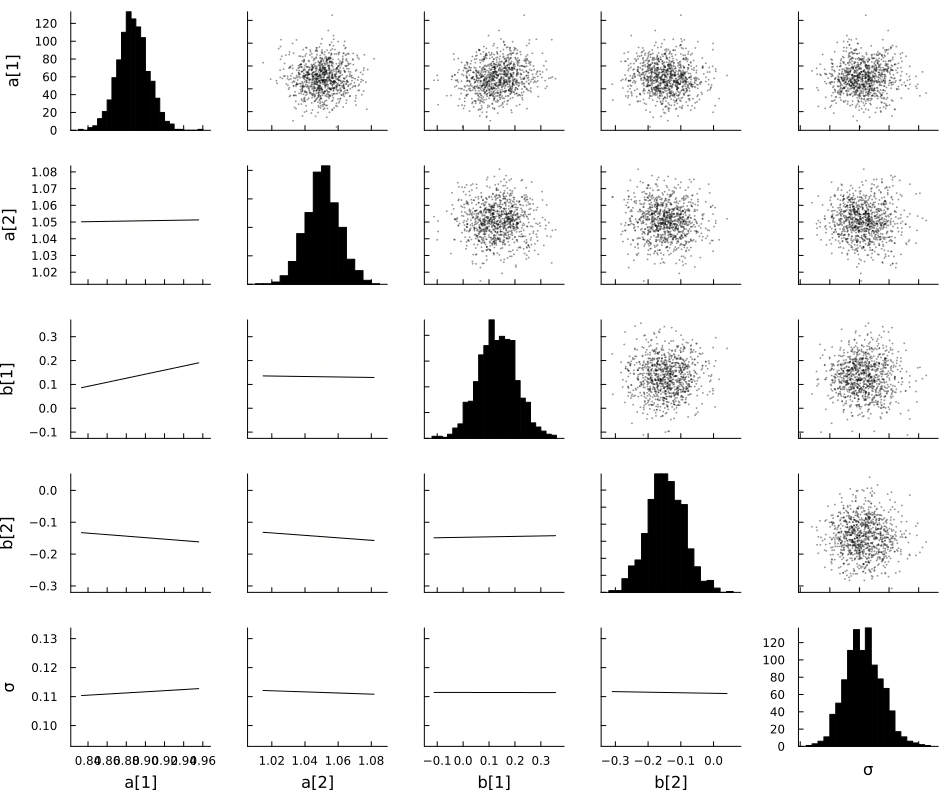

In [36]:
@time @df DataFrame(m9_1) corrplot(cols(1:5), seriestype=:scatter, ms=0.2, size=(950, 800), bins=30, grid=false)

## Code 9.20 Checking the chain: traceplot

In [37]:
parentmodule(traceplot)

MCMCChains

  0.856211 seconds (810.83 k allocations: 55.136 MiB, 99.52% compilation time)


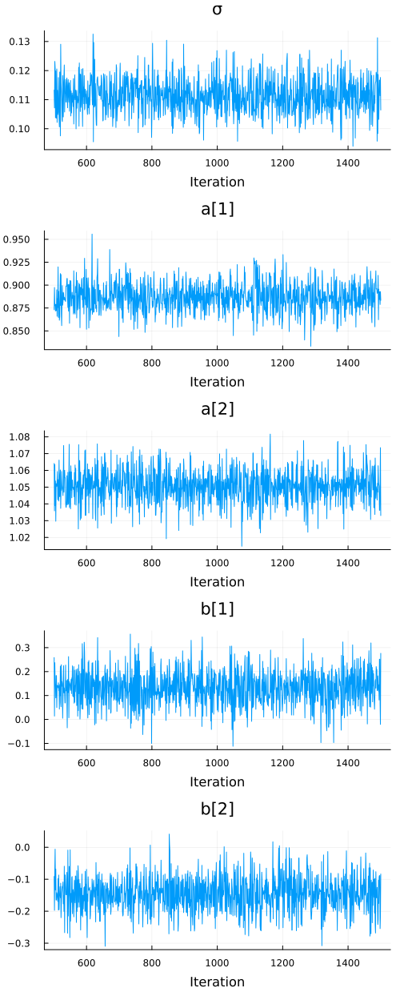

In [39]:
@time traceplot(m9_1)

  0.067234 seconds (47.90 k allocations: 3.376 MiB, 92.80% compilation time)


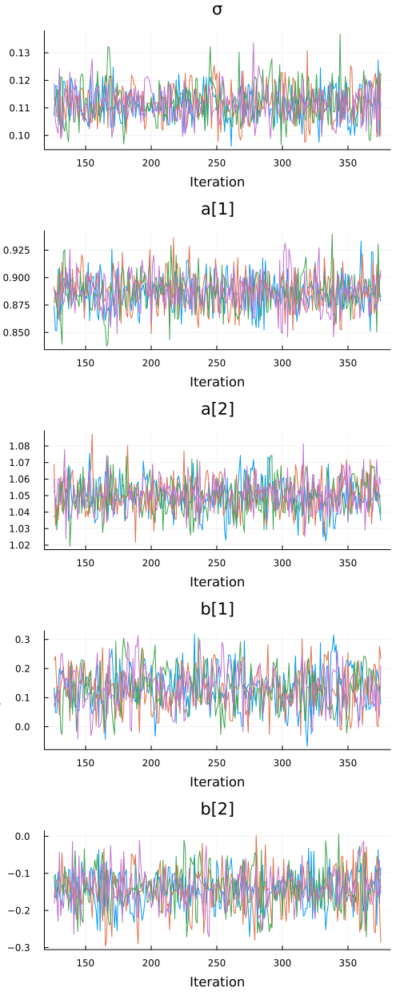

In [40]:
@time traceplot(m9_1_4chains)

## Code 9.21 histogram of MCMC estimates

  0.172378 seconds (165.47 k allocations: 10.978 MiB, 95.13% compilation time)


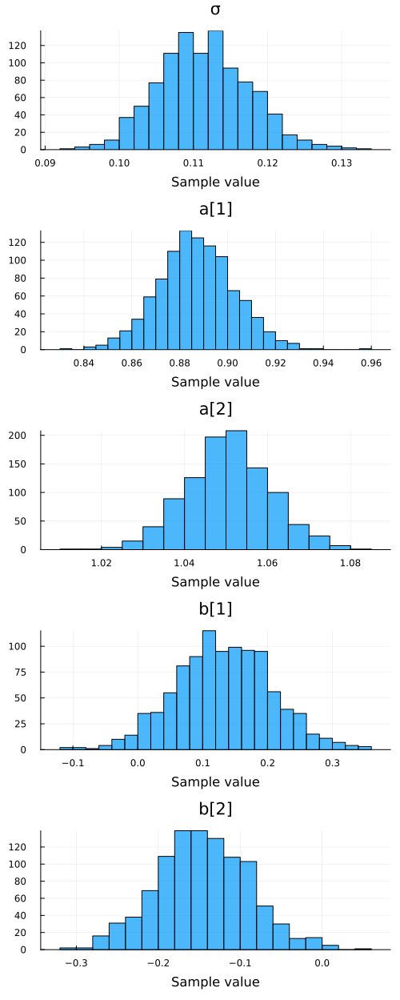

In [42]:
@time histogram(m9_1)

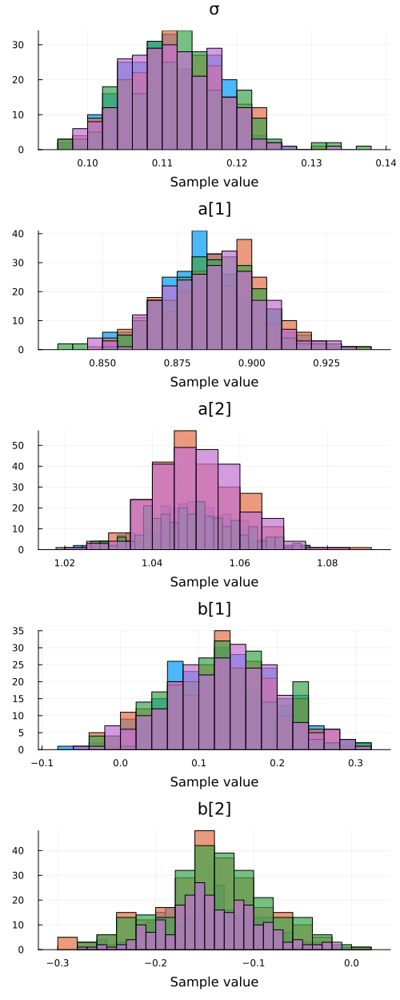

In [43]:
histogram(m9_1_4chains)

# 9.5 Care and feeding of your Markov chain

## Code 9.22 Wild MCMC chain with very flat prior and two data points.

To make it diverging with Turing, was needed to increase exp() argument (from 0.0001 to 1/0.0001).

In [44]:
Random.seed!(1)
y = [-1., 1.]

@model function model_m9_2(y)
    α ~ Normal(0, 1000)
    σ ~ Exponential(1/0.0001)
    y ~ Normal(α, σ)
end

@time m9_2 = sample(model_m9_2(y), NUTS(), 1000)
@time m9_2_df = DataFrame(m9_2);

  7.778788 seconds (9.34 M allocations: 645.278 MiB, 4.68% gc time, 95.53% compilation time)
  0.000124 seconds (71 allocations: 36.297 KiB)


In [54]:
@time m9_2 = sample(model_m9_2(y), NUTS(), 1000)
@time m9_2_df = DataFrame(m9_2);

  0.264887 seconds (1.32 M allocations: 104.897 MiB, 9.23% gc time)
  0.000097 seconds (71 allocations: 36.297 KiB)


In [51]:
ess_rhat(m9_2)

ESS/R-hat
  parameters       ess      rhat   ess_per_sec 
      Symbol   Float64   Float64       Float64 

           α   91.1486    1.0123       16.3115
           σ   16.1787    1.0273        2.8953


In [53]:
?ess_rhat

search: ess_rhat



```
ess_rhat(
    samples::AbstractArray{<:Union{Missing,Real}};
    kind::Symbol=:rank,
    kwargs...,
) -> NamedTuple{(:ess, :rhat)}
```

Estimate the effective sample size and $\widehat{R}$ of the `samples` of shape `(draws, [chains[, parameters...]])`.

When both ESS and $\widehat{R}$ are needed, this method is often more efficient than calling `ess` and `rhat` separately.

See [`rhat`](@ref) for a description of supported `kind`s and [`ess`](@ref) for a description of `kwargs`.

---

```
ess_rhat(chains::Chains; duration=compute_duration, kwargs...)
```

Estimate the effective sample size and the $\widehat{R}$ diagnostic

ESS per second options include `duration=MCMCChains.compute_duration` (the default) and `duration=MCMCChains.wall_duration`.


### Code 9.23 Check the estimates, traceplot, histogram 

In [45]:
describe(m9_2_df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,α,-7.00748,-1837.35,-0.189339,1582.93,0,Float64
2,σ,526.252,8.59881,76.6043,17567.1,0,Float64


In [24]:
precis(m9_2_df)

┌───────┬─────────────────────────────────────────────────────────┐
│ param │    mean      std      5.5%      50%    94.5%  histogram │
├───────┼─────────────────────────────────────────────────────────┤
│     α │ -7.0075  290.117  -535.734  -0.1893  429.386   ▁▁▁██▁▁▁ │
│     σ │ 526.252  1296.11   10.1492  76.6043   2401.1  █▁▁▁▁▁▁▁▁ │
└───────┴─────────────────────────────────────────────────────────┘


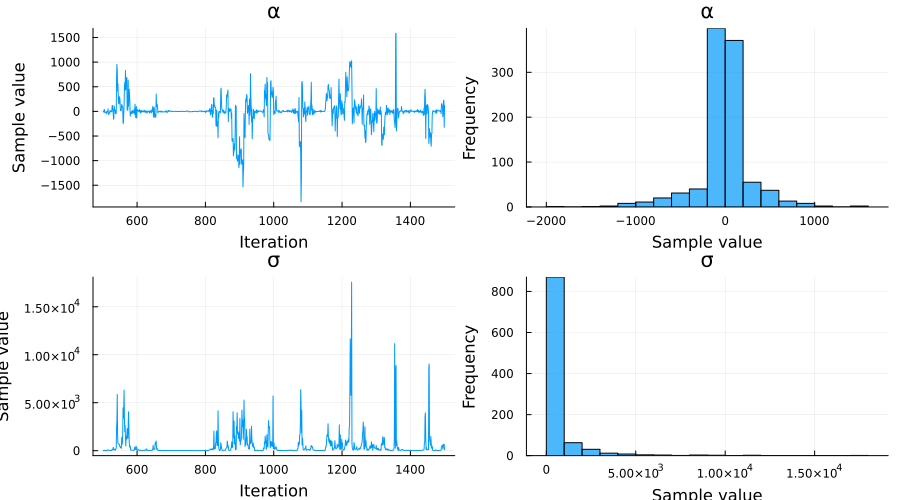

In [50]:
plot(
    traceplot(m9_2),
    histogram(m9_2),
    size=(900, 500)
)

### 9.23.1 Use the same variance prior as the book. Turing is able to converge.

In [47]:
@model function model_m9_2_as_book(y)
    α ~ Normal(0, 1000)
    σ ~ Exponential(0.0001)
    y ~ Normal(α, σ)
end

@time m9_2_as_book = sample(model_m9_2_as_book(y), NUTS(), 1000)
@time m9_2_as_book_df = DataFrame(m9_2_as_book);

  3.238671 seconds (2.91 M allocations: 211.282 MiB, 3.23% gc time, 92.73% compilation time)
  0.000086 seconds (71 allocations: 36.297 KiB)


In [52]:
ess_rhat(m9_2_as_book)

ESS/R-hat
  parameters        ess      rhat   ess_per_sec 
      Symbol    Float64   Float64       Float64 

           α   278.2992    0.9996      133.0302
           σ   838.7759    1.0000      400.9445


In [48]:
describe(m9_2_as_book_df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,α,0.00104732,-0.118927,0.00276706,0.119897,0,Float64
2,σ,0.0584712,0.0542595,0.0584274,0.063222,0,Float64


In [62]:
std.(eachcol(m9_2_as_book_df))

2-element Vector{Float64}:
 0.04180201502679007
 0.0013832425070283902

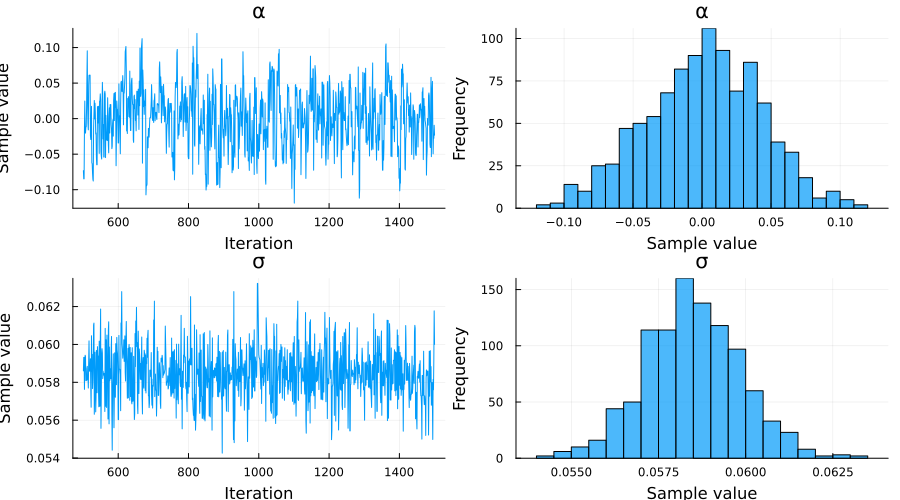

In [49]:
plot(
    traceplot(m9_2_as_book),
    histogram(m9_2_as_book),
    size=(900, 500)
)

### Code 9.24 Narrow the prior

In [55]:
Random.seed!(2)

@model function model_m9_3(y)
    α ~ Normal(1, 10)
    σ ~ Exponential(1)
    y ~ Normal(α, σ)
end

@time m9_3 = sample(model_m9_3(y), NUTS(), 1000)
@time m9_3_df = DataFrame(m9_3)

  3.243634 seconds (2.93 M allocations: 213.210 MiB, 2.88% gc time, 92.48% compilation time)
  0.000087 seconds (71 allocations: 36.297 KiB)


Row,α,σ
,Float64,Float64
1,0.230654,0.972028
2,0.996156,0.829412
3,0.221554,1.07068
4,-0.0780732,0.563202
5,0.489988,0.702608
6,0.187103,1.14002
7,-0.303806,1.58113
8,0.606341,1.44107
9,0.17999,0.886088


- precis() will err because pretty-table ... (incompatible)

In [44]:
precis(m9_3_df)

┌───────┬─────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%     50%   94.5%      histogram │
├───────┼─────────────────────────────────────────────────────────┤
│     α │ -0.0271  1.2576  -1.9354  0.0051  1.9253   ▁▁▁▁▃██▂▁▁▁▁ │
│     σ │  1.5607  0.8481   0.6739  1.3216  3.1969  ▁██▅▃▂▂▁▁▁▁▁▁ │
└───────┴─────────────────────────────────────────────────────────┘


In [56]:
describe(m9_3_df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,α,0.125371,-3.58576,0.0689179,6.92221,0,Float64
2,σ,1.57436,0.463069,1.38004,5.3544,0,Float64


In [61]:
std.(eachcol(m9_3_df))

2-element Vector{Float64}:
 1.205844220872262
 0.7905151145328265

In [57]:
ess_rhat(m9_3)

ESS/R-hat
  parameters        ess      rhat   ess_per_sec 
      Symbol    Float64   Float64       Float64 

           α   279.0366    0.9990      132.8745
           σ   274.8662    1.0023      130.8887


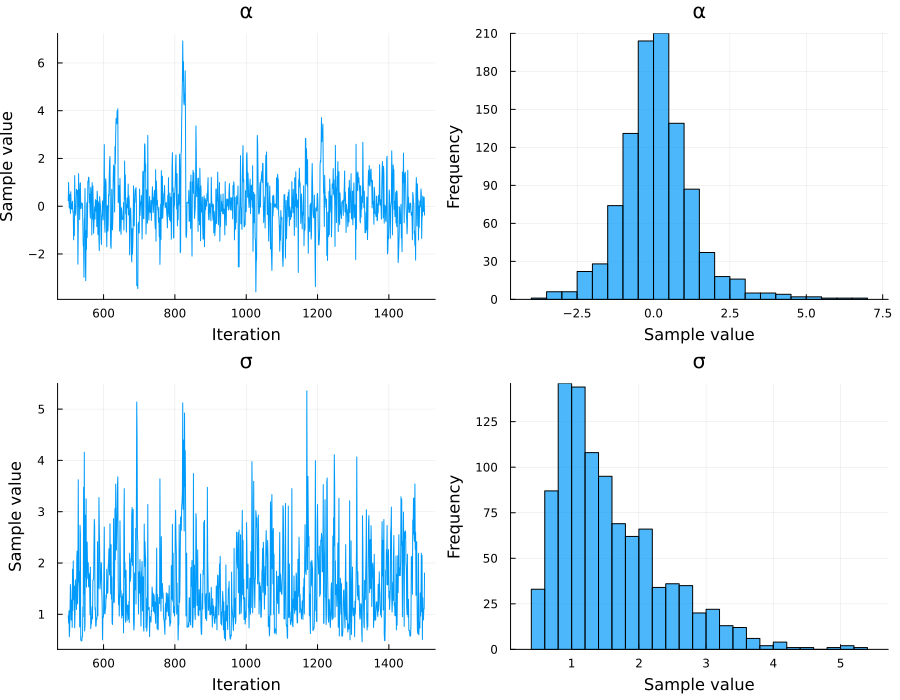

In [74]:
plot(
    traceplot(m9_3),
    histogram(m9_3),
    size=(900, 700)
)

## Code 9.25 Non-identifiable parameters

In [63]:
Random.seed!(41)
y = rand(Normal(), 100);

### Code 9.26 m9_4: Non-identifiable parameters + Flat prior

In [65]:
Random.seed!(384)

@model function model_m9_4(y)
    a1 ~ Normal(0, 1000)
    a2 ~ Normal(0, 1000)
    σ ~ Exponential(1)
    μ = a1 + a2
    y ~ Normal(μ, σ)
end

@time m9_4 = sample(model_m9_4(y), NUTS(), 1000)
m9_4_df = DataFrame(m9_4)
@show describe(m9_4_df)

ess_rhat(m9_4)

 18.726303 seconds (77.63 M allocations: 7.006 GiB, 6.67% gc time, 47.11% compilation time)
describe(m9_4_df) = 3×7 DataFrame
 Row │ variable  mean       min           median     max        nmissing  eltype
     │ Symbol    Float64    Float64       Float64    Float64    Int64     DataType
─────┼─────────────────────────────────────────────────────────────────────────────
   1 │ a1         76.0651    -527.086     -17.116    1280.98           0  Float64
   2 │ a2        -76.1075   -1280.85       17.0966    526.908          0  Float64
   3 │ σ           1.02494      0.833166    1.01593     1.3076         0  Float64


ESS/R-hat
  parameters       ess      rhat   ess_per_sec 
      Symbol   Float64   Float64       Float64 

          a1    3.6502    1.3963        0.2200
          a2    3.6503    1.3963        0.2200
           σ   62.8801    1.0042        3.7893


In [66]:
std.(eachcol(m9_4_df))

3-element Vector{Float64}:
 333.8606945872928
 333.86098194569007
   0.08677088323140798

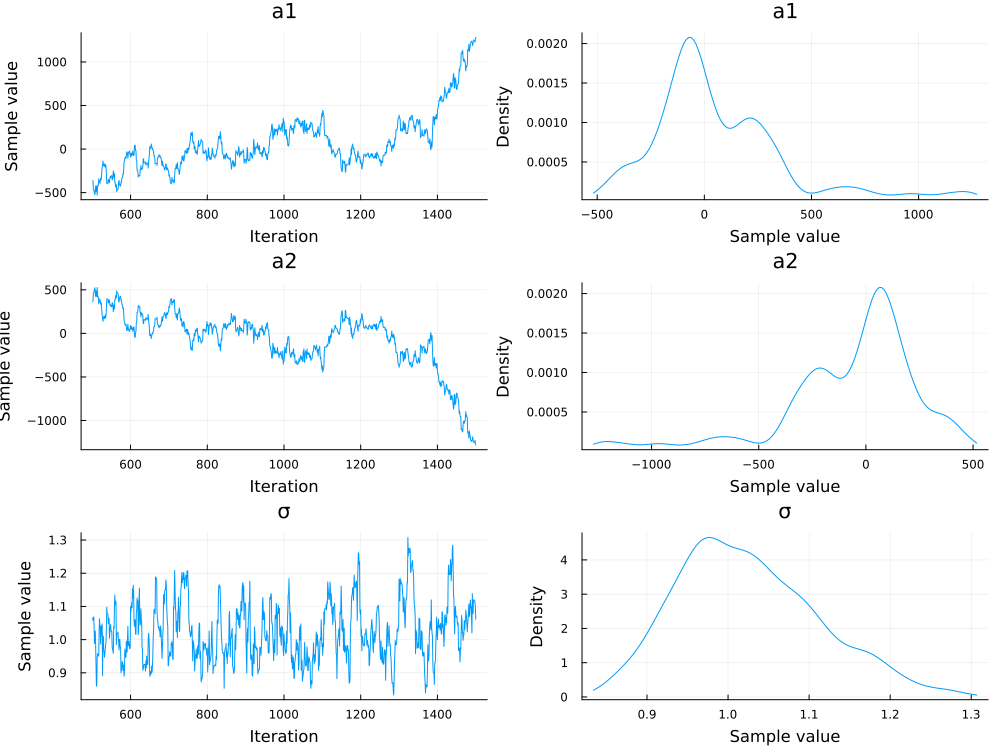

In [67]:
plot(m9_4)

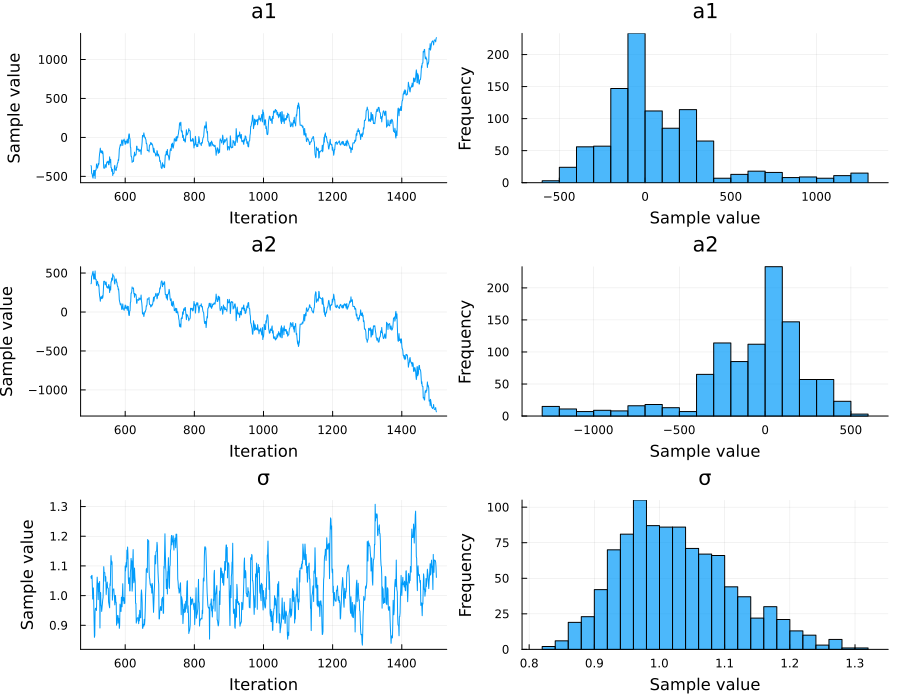

In [70]:
plot(
    traceplot(m9_4),
    histogram(m9_4),
    size=(900, 700)
)

In [ ]:
precis(m9_4_df)

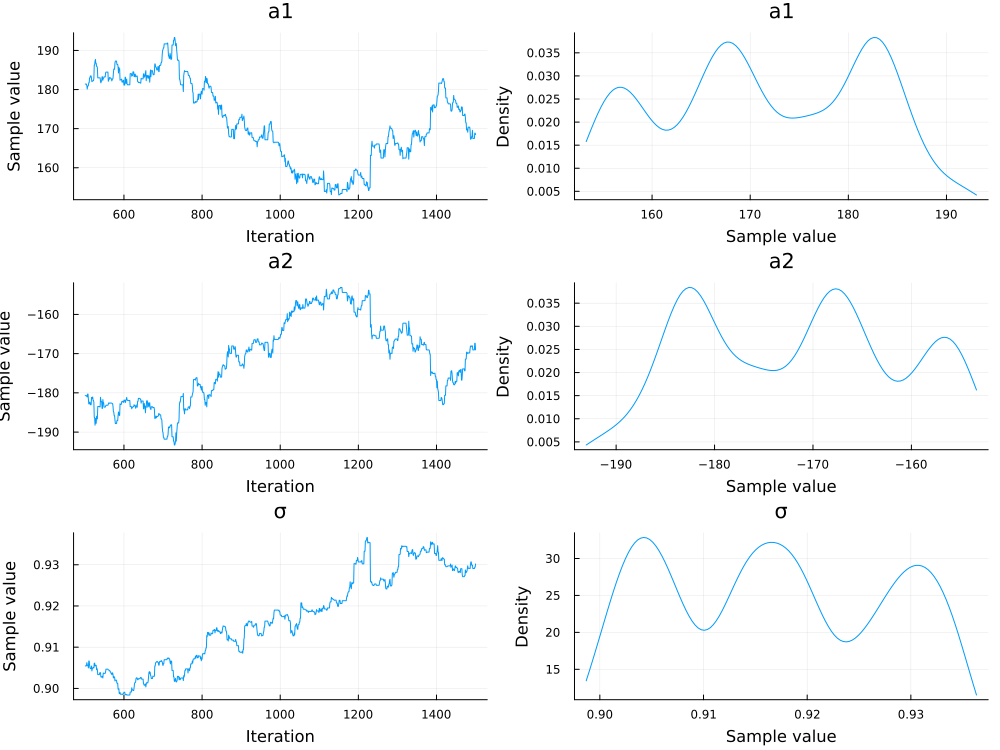

In [50]:
#old plot
plot(m9_4)

### Code 9.27 Narrow the prior

  2.797526 seconds (3.15 M allocations: 279.739 MiB, 5.31% gc time, 82.01% compilation time: 84% of which was recompilation)
┌───────┬───────────────────────────────────────────────────────┐
│ param │   mean     std      5.5%      50%    94.5%  histogram │
├───────┼───────────────────────────────────────────────────────┤
│    a1 │ -0.889  7.3615  -13.2932  -0.6542  11.0716  ▁▄▆██▅▂▁▁ │
│    a2 │  0.873  7.3468  -11.1467   0.6142  13.1903   ▁▂▅██▅▄▁ │
│     σ │ 1.5523  0.9584    0.6069   1.2865   3.3538  ▇█▄▁▁▁▁▁▁ │
└───────┴───────────────────────────────────────────────────────┘


nothing

ESS/R-hat
  parameters       ess      rhat   ess_per_sec 
      Symbol   Float64   Float64       Float64 

          a1   88.6145    1.0019       48.1863
          a2   90.0207    1.0027       48.9509
           σ   50.2621    1.0129       27.3312


In [71]:
Random.seed!(384)

@model function model_m9_5(y)
    a1 ~ Normal(0, 10)
    a2 ~ Normal(0, 10)
    σ ~ Exponential(1)
    μ = a1 + a2
    y ~ Normal(μ, σ)
end

@time m9_5 = sample(model_m9_5(y), NUTS(), 1000)
m9_5_df = DataFrame(m9_5)
display(describe(m9_5_df))
ess_rhat(m9_5)

  6.313338 seconds (21.42 M allocations: 1.941 GiB, 5.86% gc time, 51.78% compilation time)


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,a1,0.267958,-22.5984,0.552417,17.8023,0,Float64
2,a2,-0.305376,-17.9075,-0.566801,22.5765,0,Float64
3,σ,1.01157,0.832464,1.00441,1.27443,0,Float64


ESS/R-hat
  parameters        ess      rhat   ess_per_sec 
      Symbol    Float64   Float64       Float64 

          a1   361.8065    0.9995       71.1657
          a2   361.0548    0.9995       71.0179
           σ   347.0041    1.0235       68.2541


In [72]:
std.(eachcol(m9_5_df))

3-element Vector{Float64}:
 7.226273178206555
 7.221558071617307
 0.06830657817146249

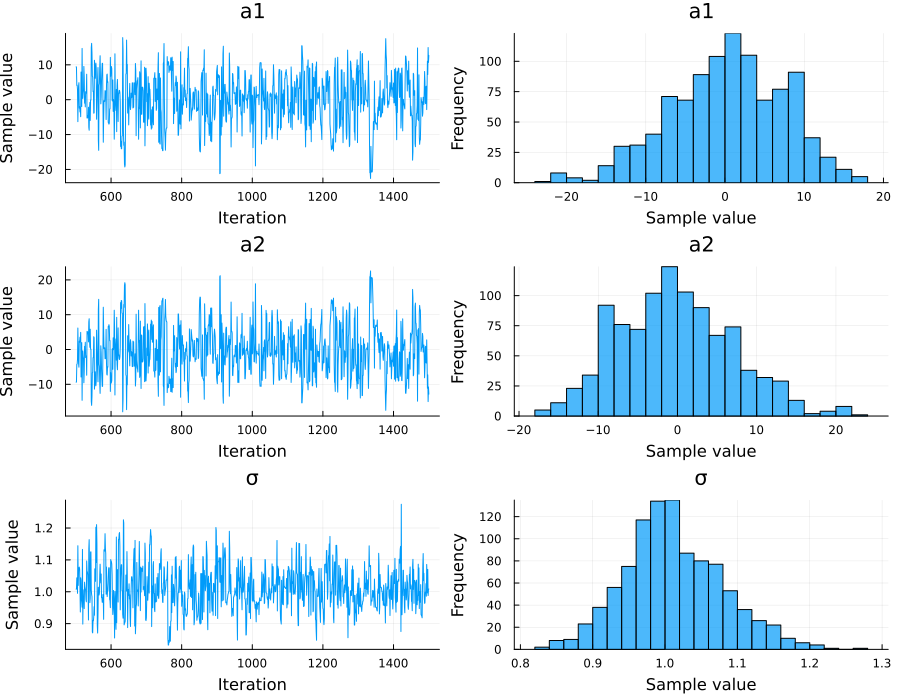

In [73]:
plot(
    traceplot(m9_5),
    histogram(m9_5),
    size=(900, 700)
)

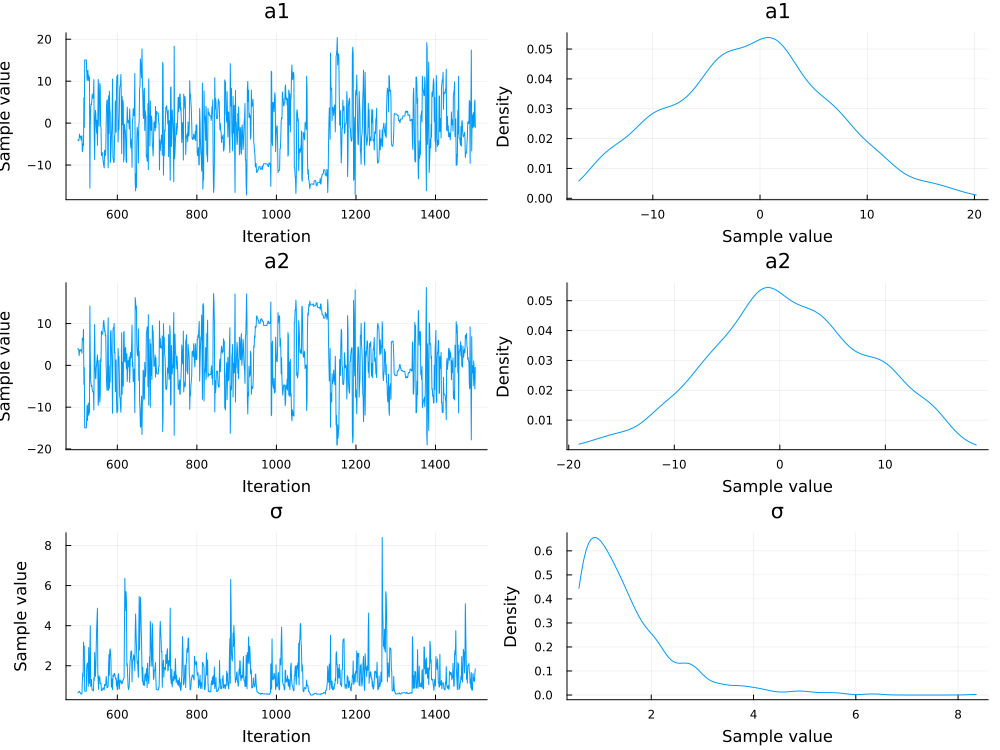

In [52]:
#old plot
plot(m9_5)